In [1]:
%matplotlib widget
import numpy as np
import matplotlib.pyplot as plt
import fibretracker as ft

In [2]:
data_path = '/Users/pooja/Documents/PhD_work/ICPR_docs/data/Mock_UD_GFRP_data/UD-01_FoV_2_B2_recon.txm'
data_path1 = 'data/Mock_UD_GFRP_data/Mock-01_FoV_2_B2_recon.txm'
data_path2 = 'data/Mock_UD_GFRP_data/GFRP'
data_path3 = 'data/Mock_UD_GFRP_data/XCT_LR'

V_UD = ft.io.load(data_path)
# V_Mock = ft.io.load(data_path1)
# V_GFRP = ft.io.load(data_path2, contains='.tif')
# V_XCTLR = ft.io.load(data_path3, contains='.tif')

V_norm = ft.io.normalize(V_UD).astype(float)

astropy module not found


interactive(children=(IntSlider(value=499, description='Slice', max=998, style=SliderStyle(description_width='…

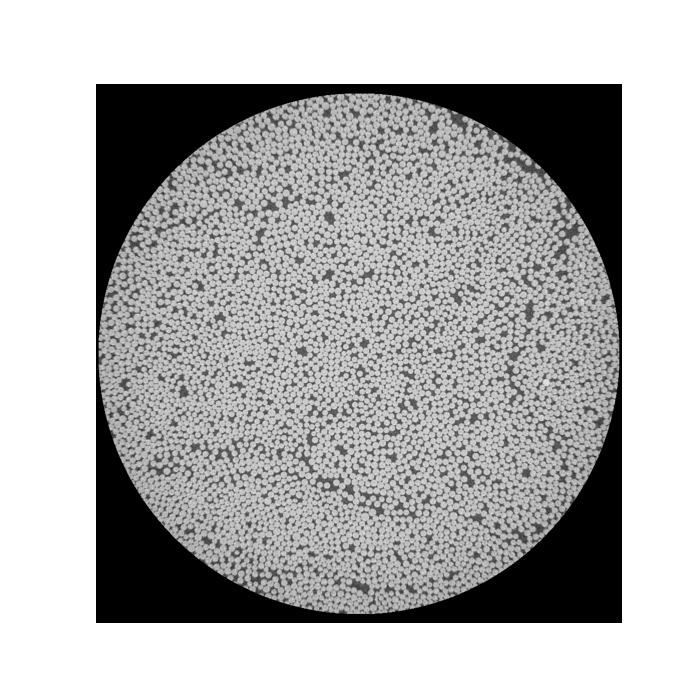

In [3]:
ft.viz.slicer(V_norm, img_height=7, img_width=7, cmap='gray')

In [4]:
V_tmp = V_norm[100:350, V_norm.shape[1]//2 - 250:V_norm.shape[1]//2 + 250, V_norm.shape[2]//2 - 250:V_norm.shape[2]//2 + 250]

interactive(children=(IntSlider(value=125, description='Slice', max=249, style=SliderStyle(description_width='…

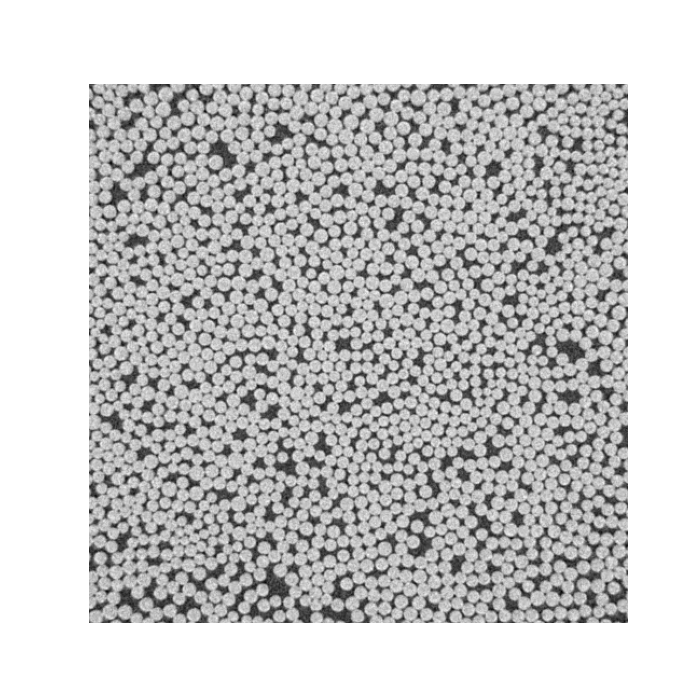

In [5]:
ft.viz.slicer(V_tmp, img_height=7, img_width=7, cmap='gray')

interactive(children=(HBox(children=(IntSlider(value=125, description='Z', max=249), IntSlider(value=250, desc…

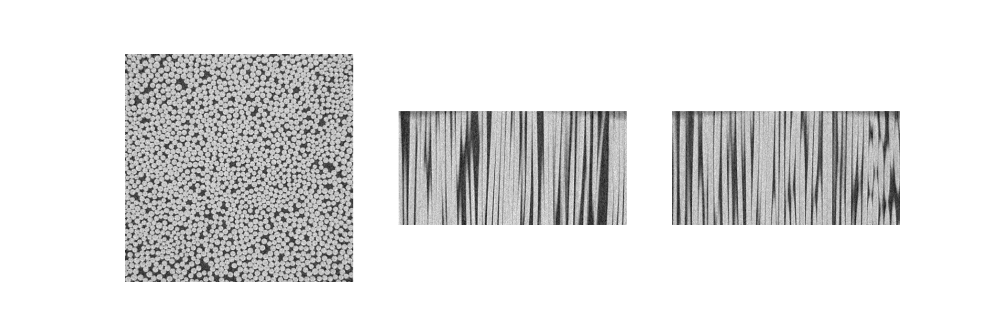

In [6]:
ft.viz.orthogonal(V_tmp, img_height=7, img_width=7, cmap='gray')

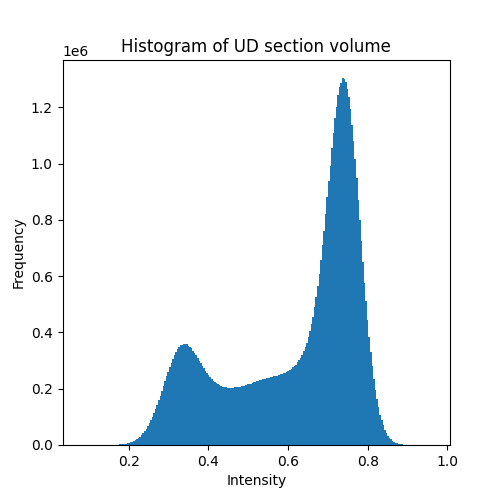

In [7]:
n_bins = int(255*(V_tmp.max() - V_tmp.min()) + 1)
hist, bins = np.histogram(V_tmp, bins=n_bins)
bin_width = bins[1] - bins[0]
fig, ax = plt.subplots(1, figsize=(5, 5))
ax.bar(bins[:-1], hist, width=bin_width)
ax.set_xlabel('Intensity')
ax.set_ylabel('Frequency')
ax.set_title('Histogram of UD section volume')
plt.show()

In [9]:
coords = ft.models.get_fibre_coords(V_tmp, std=2.5, min_distance=3, threshold_abs=0.6)

interactive(children=(IntSlider(value=125, description='Slice', max=249, style=SliderStyle(description_width='…

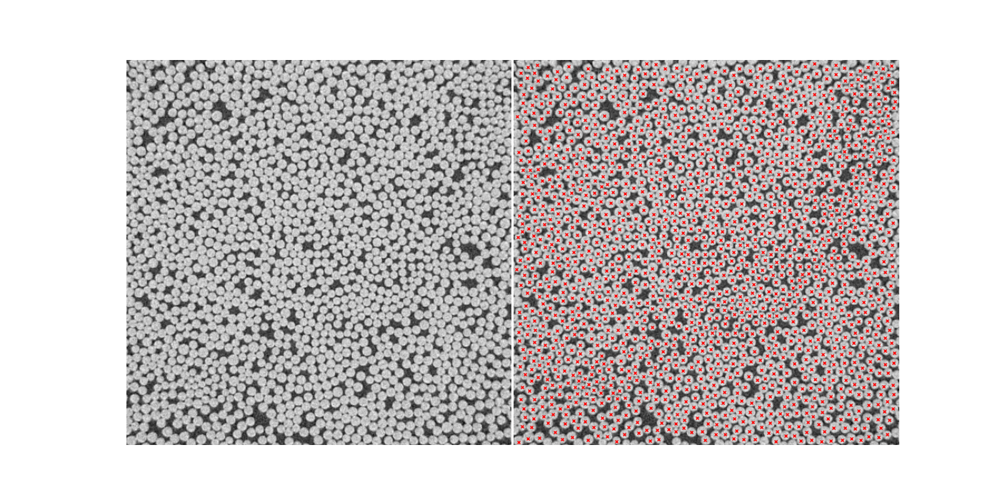

In [10]:
ft.viz.slicer(V_tmp, detect_coords=coords, mark_size=3, img_height=7, img_width=7, cmap='gray')

In [11]:
# fibre can be tracked either directly from the volume or from the detected coordinates, or both[to avoid coordinate detection again]

tracks = ft.models.track_fibres(coords=coords)
tracks_gauss = ft.models.track_fibres(V_tmp, coords=coords, smoothtrack_gaussian=True, sigma=2)
tracks_ws = ft.models.track_fibres(V_tmp, coords=coords, smoothtrack_watershed=True, threshold=0.6)

# tracks = ft.models.track_fibres(V_tmp, smoothtrack_watershed=True, threshold=0.5)
# tracks = ft.models.track_fibres(V_tmp, smoothtrack_gaussian=True)
# tracks = ft.models.track_fibres(coords=coords)
# tracks = ft.models.track_fibres(coords=coords, smoothtrack_gaussian=True)

Smoothing tracks using Gaussian       
Smoothing tracks using watershed...   
Watershed volume created.


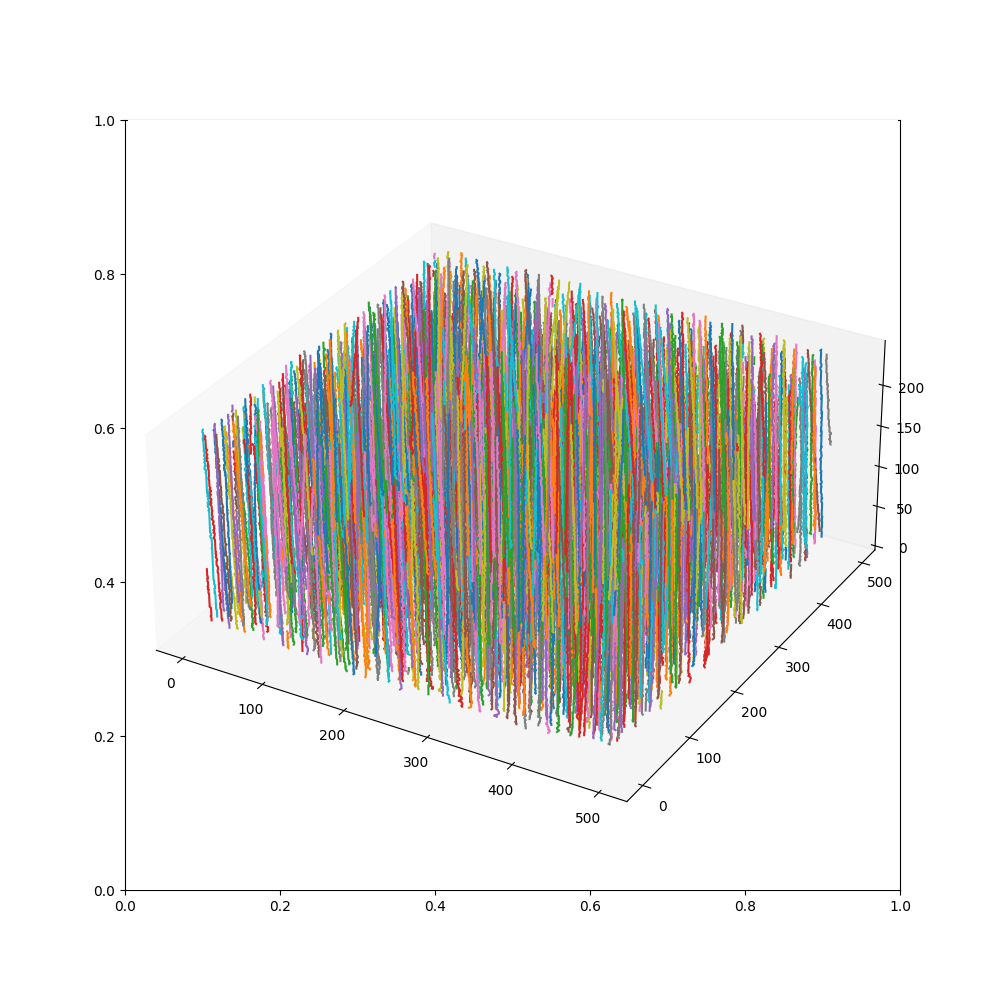

(<Figure size 1000x1000 with 2 Axes>, <Axes3D: >)

In [12]:
ft.viz.plot_tracks(tracks)

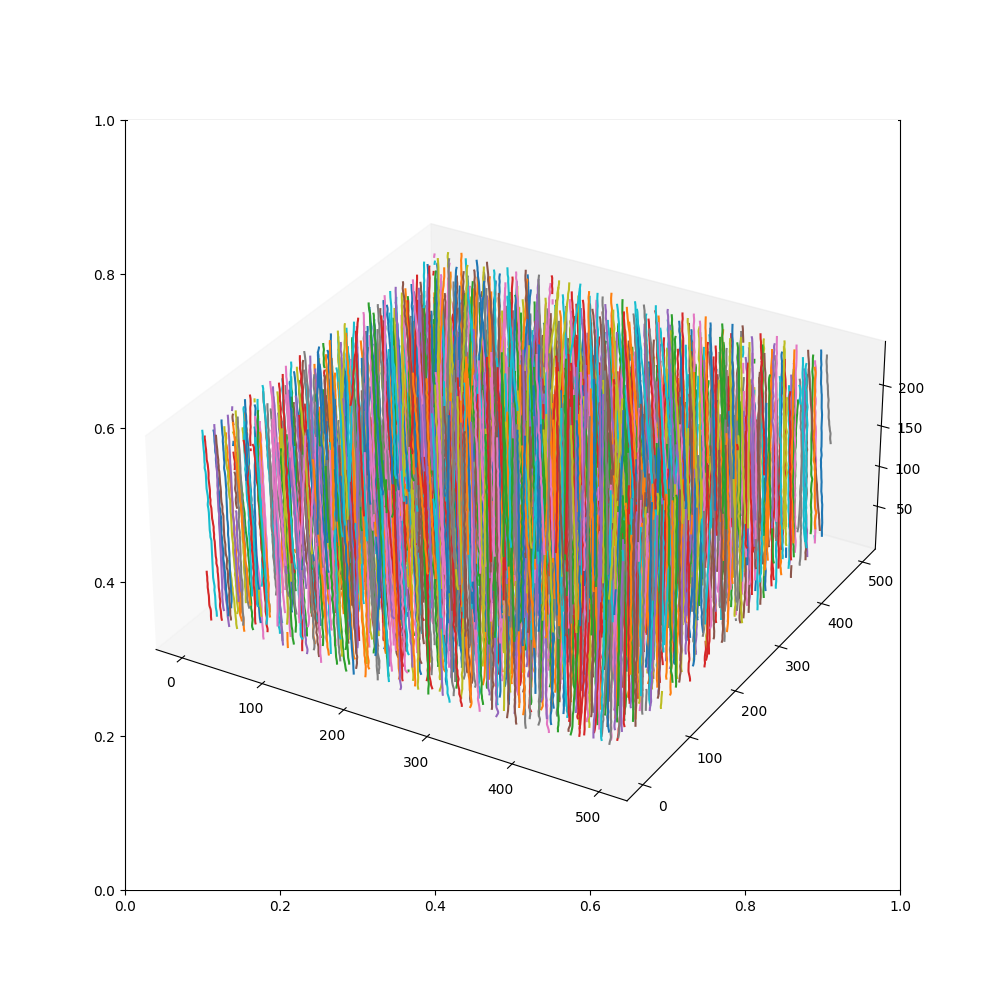

(<Figure size 1000x1000 with 2 Axes>, <Axes3D: >)

In [13]:
ft.viz.plot_tracks(tracks_gauss)

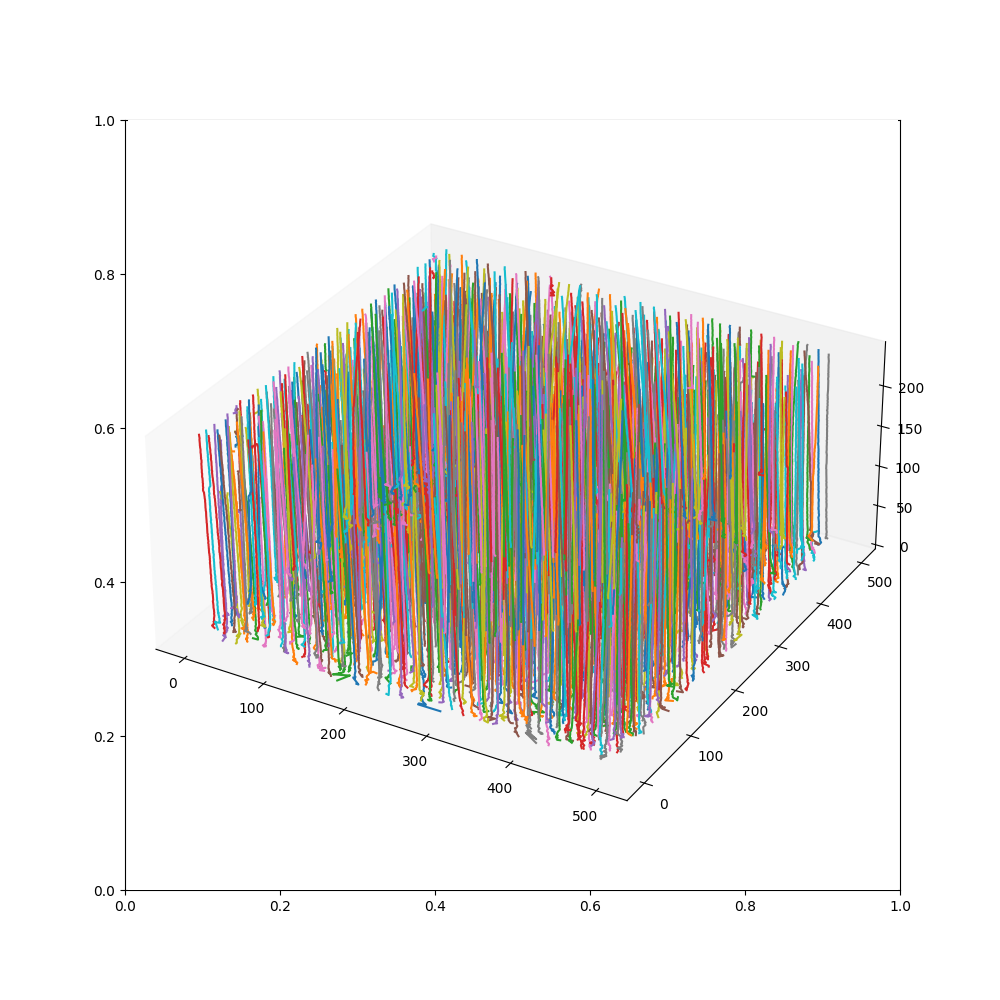

(<Figure size 1000x1000 with 2 Axes>, <Axes3D: >)

In [14]:
ft.viz.plot_tracks(tracks_ws)